<a href="https://colab.research.google.com/github/nctamer/violin-etudes/blob/main/ViolinEtudesYouTubeAccess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@markdown Import modules
!git clone https://github.com/nctamer/violin-etudes.git   &> /dev/null
!pip install libf0   &> /dev/null
!pip install yt-dlp   &> /dev/null
from IPython.display import YouTubeVideo
import librosa
import IPython.display as ipd
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.utils.data import DataLoader
import random
import numpy as np
import librosa
from librosa.sequence import viterbi_discriminative
import sys, math
from glob import glob
import time
import numpy as np
import matplotlib.image as mpimg
from tqdm import tqdm
from pathlib import Path
import os
from scipy.stats import norm
import pandas as pd
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import libf0

def plot_f0_trajectory(Y_LF, t, f, f0, t_f0, figsize=(8.5, 3.4), xlim=(0, 11.5), ylim=(2000, 6000)):
    """
    Plot a calculated f0 trajectory on the corresponding spectrogram
    
    Parameters
    ----------
    Y_LF : np.ndarray
        log-frequency spectrogram
    t : np.ndarray
        time axis of the spectrogram
    f : np.ndarray
        log-frequency axis of the spectrogram in cents
    f0 : np.ndarray
        f0 trajectory in cents
    t_f0 : np.ndarray
        time points of the f0 trajectory frames
    figsize : tuple
        figure size
    xlim : tuple
        x-limits
    ylim : tuple
        y-limits
    """
    plt.figure(figsize=figsize)

    plt.imshow(Y_LF, cmap='gray_r', aspect='auto', origin='lower', extent=[t[0], t[-1], f[0], f[-1]])
    plt.plot(t_f0, f0, linestyle='', marker='.', markersize=5, color=[192/256, 0, 0])

    plt.xlim(xlim)
    plt.ylim(ylim)

    plt.gca().tick_params(axis='both', which='major', labelsize=10)
    plt.gca().tick_params(axis='both', which='minor', labelsize=10)
    
    plt.xlabel("Time (seconds)", fontsize=12)
    plt.ylabel("Log-Frequency (cents)", fontsize=12)
    
    cbar = plt.colorbar()
    cbar.ax.get_yaxis().labelpad = 15
    cbar.ax.set_ylabel('Log-Magnitude', rotation=270)

    plt.tight_layout()
    plt.show()



In [ ]:
#@markdown Select Etude (please run this only once, the changes you do in the
#@markdown dropdown will automatically update the variables, without re-run)
import ipywidgets as widgets
from ipywidgets import HBox, Label
from ipywidgets import Layout, Button, Box, FloatText, Textarea, Dropdown, Label, IntSlider
import time
import pandas as pd
from glob import glob
import os

def split_name(name):
  name = name.rsplit('.', 2)[0]
  player = name[:2]
  end = int(name[-4:])
  start = int(name[-8:-4])
  key = name[2:-8]
  return player, key, start, end
f0_dir = 'violin-etudes/f0'
f0s = [os.path.relpath(_, f0_dir) for _ in sorted(glob(os.path.join(f0_dir,'*','*','*.RESYN.csv')))]
df = pd.DataFrame(f0s, columns=['f0Path'])
df = df.join(df['f0Path'].str.split('/',expand=True))
df.columns = ['f0Path', 'Method', 'No', 'rest']
df = df.join(pd.DataFrame(df['rest'].apply(split_name).to_list(), columns=['PlayerID', 'YouTubeKey', 'Start', 'End']))
del df['rest']
ind = list(df['Method'].unique())
dep = {m: list(df.loc[df['Method']==m, 'No'].unique()) for m in ind}


# Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)


button_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='center',
    padding = '5%'
)

# Independent dropdown item

drop_down_input = ind[-1]
drop_down = widgets.Dropdown(options=(ind[::-1]))


# Dependent drop down
# Dependent drop down elements
dependent_drop_down_elements = dep

# Define dependent drop down

dependent_drop_down = widgets.Dropdown(options=(dependent_drop_down_elements[drop_down_input]))

def dropdown_handler(change):
    global drop_down_input
    drop_down_input = change.new
    #If statement checking on dropdown value and changing options of the dependent dropdown accordingly
    for m in ind:
        if  change.new==m:
            dependent_drop_down.options=dependent_drop_down_elements[m]
drop_down.observe(dropdown_handler, names='value')

# Button

button = widgets.Button(description='Add row to dataframe')
out = widgets.Output()
def on_button_clicked(b):
    global df
    button.description = 'Row added'
    time.sleep(1)
    with out:
      new_row = {'Dropdown_column': drop_down_input, 'Float_column': float_input}
      df = df.append(new_row, ignore_index=True)
      button.description = 'Add row to dataframe'
      out.clear_output()  
      display(df)
button.on_click(on_button_clicked)

# Form items

form_items = [         
    Box([Label(value='Method'),
         drop_down], layout=form_item_layout),
    Box([Label(value='No'),
         dependent_drop_down], layout=form_item_layout)
         ]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='30%',
    padding = '1%'
))
display(form)
display(out)

Box(children=(Box(children=(Label(value='Method'), Dropdown(options=('WohlfahrtOp45', 'SuzukiVol5', 'SuzukiVol…

Output()

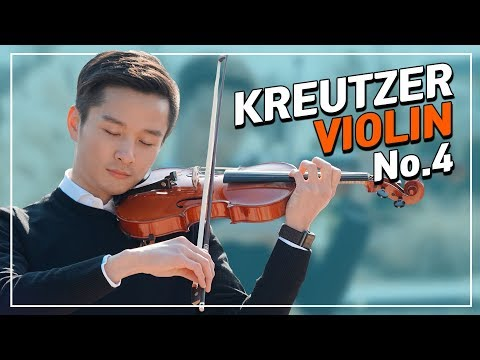

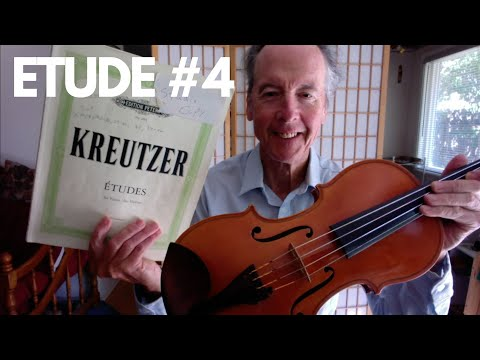

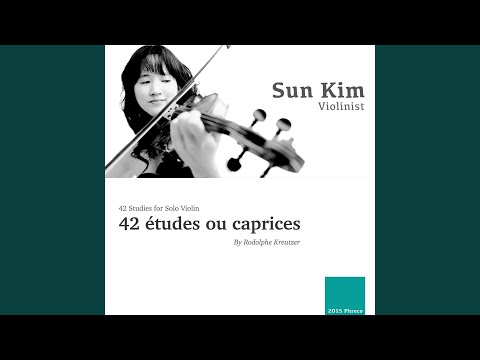

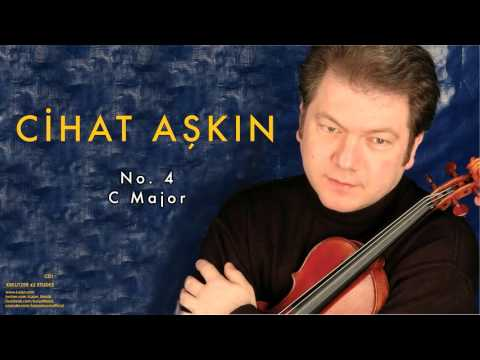

In [ ]:
#@markdown Show YouTube recordings for the specified etude

#@markdown For example, for Wohlfahrt Op. 45 No. 1 we have multiple segments from
#@markdown the same recording for the first player. Show different segments
#@markdown separately with start and end timestamps.

selected_recordings = df[(df['Method']==drop_down.value) & (df['No']==dependent_drop_down.value) ]
for i, rec in selected_recordings.iterrows():
  key = rec['YouTubeKey']
  start = rec['Start']
  end = rec['End']
  ipd.display(ipd.YouTubeVideo(key, width=500, start=start, end=end))

In [ ]:
#@markdown Download and play the first sample from above

example = selected_recordings.iloc[0]
name = 'example'
key = example['YouTubeKey']
start = example['Start']
end = example['End']
!yt-dlp https://www.youtube.com/watch?v={key} -x --audio-format wav --audio-quality 0   -o "{name}.%(ext)s"  --download-sections "*{start}-{end}"  &> /dev/null
# ipd.display(ipd.Audio('example.wav'))

x, Fs = librosa.load('example.wav', sr=22050)
ipd.display(ipd.Audio(x, rate=Fs, normalize=True)) # audio playback


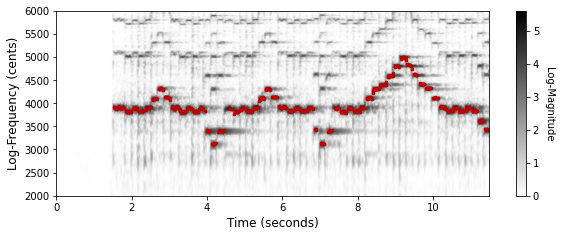

In [ ]:
#@markdown For this first sample, plot & sonify the f0 trajectory detected by
#@markdown  the SWIPE algorithm from the libf0

import libf0
from scipy.interpolate import interp1d
# shared parameters
N = 2048 # window size in samples
H = 256 # hop size in samples
zero_pad = 2048 # zero-padding for STFT (only for visualization)
F_min = 55.0 # minimum frequency of interest in Hz
F_max = 1760.0 # maximum frequency of interest in Hz
R = 10 # resolution of F0-estimations in cents
# set parameters
threshold = 0.5 # confidence threshold between 0 and 1

# calculate magnitude spectrogram of input signal for visualization
X = librosa.stft(x, n_fft=N+zero_pad, hop_length=H, win_length=N, window='hann', pad_mode='constant', center=True)
Y = np.abs(X)
F_coef_lin = librosa.fft_frequencies(sr=Fs, n_fft=N+zero_pad)
T_coef = librosa.frames_to_time(np.arange(X.shape[1]), sr=Fs, hop_length=H)

# interpolate magnitude spectrogram to a logarithmic frequency axis 
B = np.floor((1200 / R) * np.log2(F_max / F_min) + 0.5)
F_coef_log_cents = np.arange(0, B) * R 
F_coef_log_hz = 2 ** (F_coef_log_cents / 1200) * F_min
compute_Y_interpol = interp1d(F_coef_lin, Y, kind='cubic', axis=0)
Y_LF = compute_Y_interpol(F_coef_log_hz)
Y_LF[Y_LF < 0] = 0  # discard negative values after interpolation

# use log-magnitude for visualizations
Y_LF = np.log(1 + Y_LF)

# run the SWIPE algorithm
f0_swipe, t_swipe, conf_swipe = libf0.swipe(x, Fs, H, F_min, F_max, strength_threshold=threshold)

# convert trajectory to cent scale
f0_swipe_cents = libf0.hz_to_cents(f0_swipe, F_min)

# plot the result
plot_f0_trajectory(Y_LF, T_coef, F_coef_log_cents, f0_swipe_cents, t_swipe)

# sonify the result (left: sonification, right: original audio)
x_son_swipe = libf0.sonify_trajectory_with_sinusoid(f0_swipe, t_swipe, len(x), Fs=Fs)
ipd.display(ipd.Audio(np.vstack((x_son_swipe.reshape(1, -1), x.reshape(1, -1))), rate=Fs, normalize=True))